## Question 1

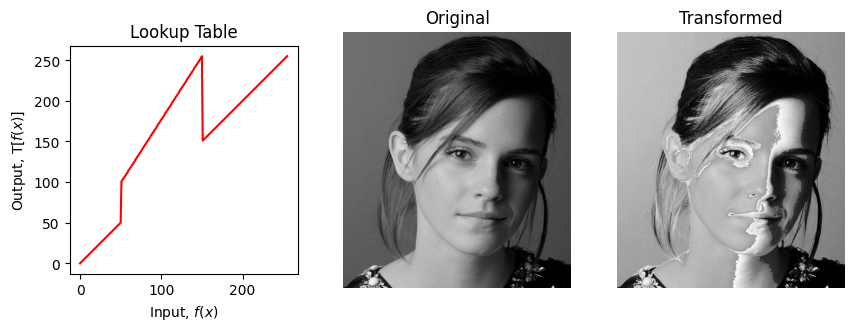

In [1]:
## code for question 1(correct code)

import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

f = cv.imread(r'a1images\a1images\emma.jpg', cv.IMREAD_GRAYSCALE)
assert f is not None

# Control points
c = np.array([(50, 50), (50, 100), (150, 255), (150, 150), (255, 255)])

# Compute the piecewise linear intensity transformation based on the control points
t1 = np.linspace(0, c[0, 1], c[0, 0] + 1).astype('uint8')  # from 0 to c[0]
t2 = np.linspace(c[0, 1] + 1, c[1, 1], c[1, 0] - c[0, 0]).astype('uint8')  # from c[0] to c[1]
t3 = np.linspace(c[1, 1] + 1, c[2, 1], c[2, 0] - c[1, 0]).astype('uint8')  # from c[1] to c[2]
t4 = np.linspace(c[2, 1] + 1, c[3, 1], c[3, 0] - c[2, 0]).astype('uint8')  # from c[2] to c[3]
t5 = np.linspace(c[3, 1] + 1, c[4, 1], 255 - c[3, 0]).astype('uint8')  # from c[3] to c[4]

# Concatenate the piecewise linear transformation parts
t = np.concatenate((t1, t2), axis=0).astype('uint8')
t = np.concatenate((t, t3), axis=0).astype('uint8')
t = np.concatenate((t, t4), axis=0).astype('uint8')
t = np.concatenate((t, t5), axis=0).astype('uint8')

g = cv.LUT(f, t)


fig, ax = plt.subplots(1, 3, figsize=(10, 5))
ax[0].plot(t, 'r', label='Transformation')
ax[0].set_xlabel(r'Input, $f(x)$')
ax[0].set_ylabel(r'Output, $\mathrm{T}[f(x)]$')
ax[0].set_title('Lookup Table')
ax[0].set_aspect('equal')
ax[1].imshow(f, cmap='gray')
ax[1].set_title('Original')
ax[1].axis('off')
ax[2].imshow(g, cmap='gray')
ax[2].set_title('Transformed')
ax[2].axis('off')
plt.show()

## Question 2

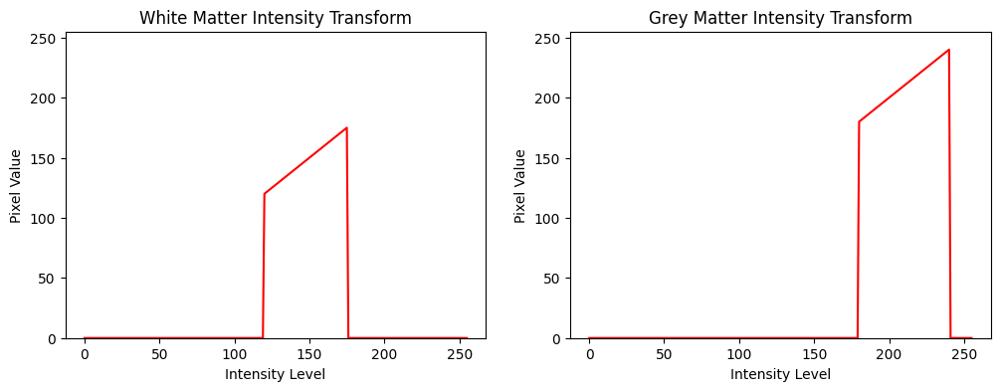

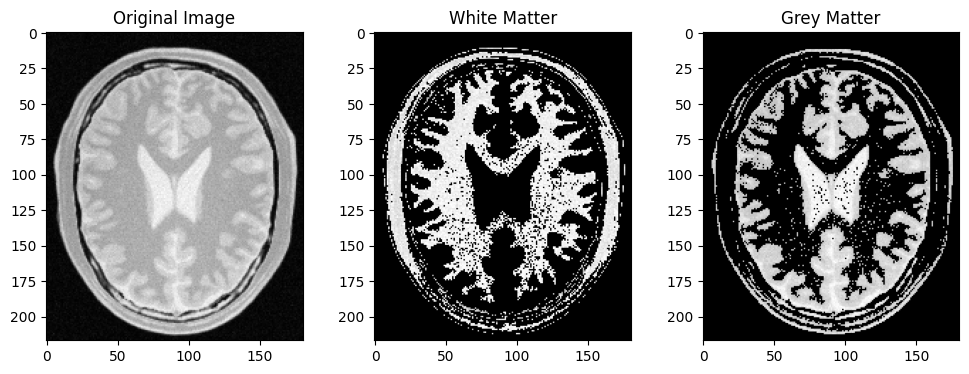

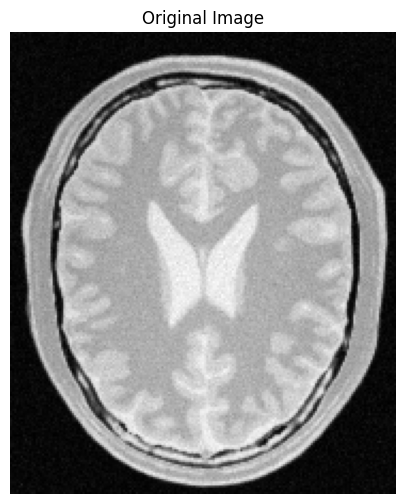

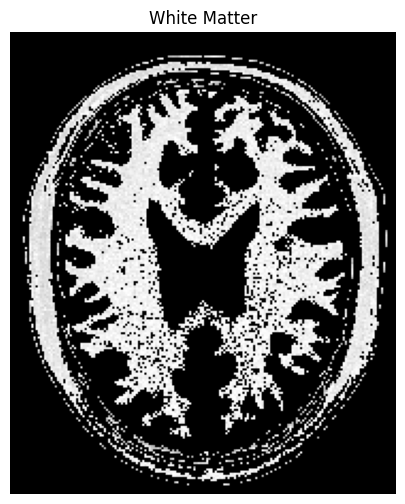

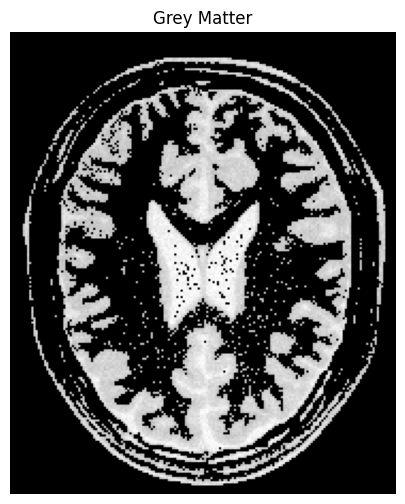

In [23]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Load the brain proton density image
image_path = 'a1images/a1images/brain_proton_density_slice.png'
brain_image = cv.imread(image_path, cv.IMREAD_GRAYSCALE)

white_th = np.array([120,175], dtype=np.uint8)
grey_th = np.array([180,240], dtype=np.uint8)

white_matter_transform = np.zeros(256, dtype=np.uint8)
white_matter_transform[white_th[0]:white_th[1]+1] = np.linspace(white_th[0], white_th[1],white_th[1]-white_th[0]+1,dtype=np.uint8)

grey_matter_transform = np.zeros(256, dtype=np.uint8)
grey_matter_transform[grey_th[0]:grey_th[1]+1] = np.linspace(grey_th[0], grey_th[1],grey_th[1]-grey_th[0]+1,dtype=np.uint8)

white_matter = cv2.LUT(brain_image, white_matter_transform)
grey_matter = cv2.LUT(brain_image, grey_matter_transform)

#plot intensity transform functions
fig,ax = plt.subplots(1,2,figsize=(12,4))

ax[0].plot(white_matter_transform, 'r')
ax[0].set_title('White Matter Intensity Transform')
ax[0].set_xlabel('Intensity Level')
ax[0].set_ylabel('Pixel Value')
ax[0].set_ylim([0,255])

ax[1].plot(grey_matter_transform, 'r')
ax[1].set_title('Grey Matter Intensity Transform')
ax[1].set_xlabel('Intensity Level')
ax[1].set_ylabel('Pixel Value')
ax[1].set_ylim([0,255])

#plot images

fig,ax = plt.subplots(1,3,figsize=(12,4))

ax[0].imshow(brain_image, cmap='gray')
ax[0].set_title('Original Image')

ax[1].imshow(white_matter, cmap='gray')
ax[1].set_title('White Matter')

ax[2].imshow(grey_matter, cmap='gray')
ax[2].set_title('Grey Matter')

plt.show()

#for seperate plots
plt.figure(figsize=(6, 6))
plt.imshow(brain_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')
plt.show()

plt.figure(figsize=(6, 6))
plt.imshow(white_matter, cmap='gray')
plt.title('White Matter')
plt.axis('off')
plt.show()

plt.figure(figsize=(6, 6))
plt.imshow(grey_matter, cmap='gray')
plt.title('Grey Matter')
plt.axis('off')
plt.show()


## Question 3

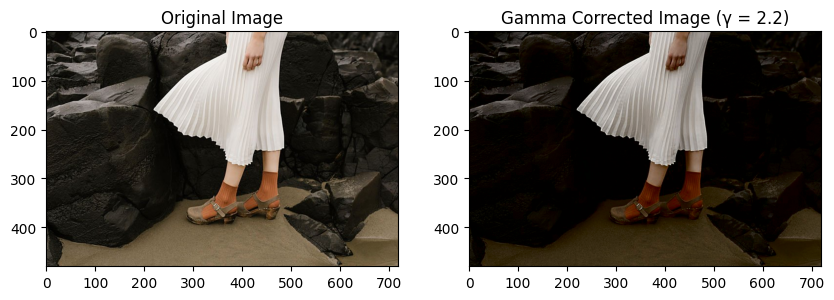

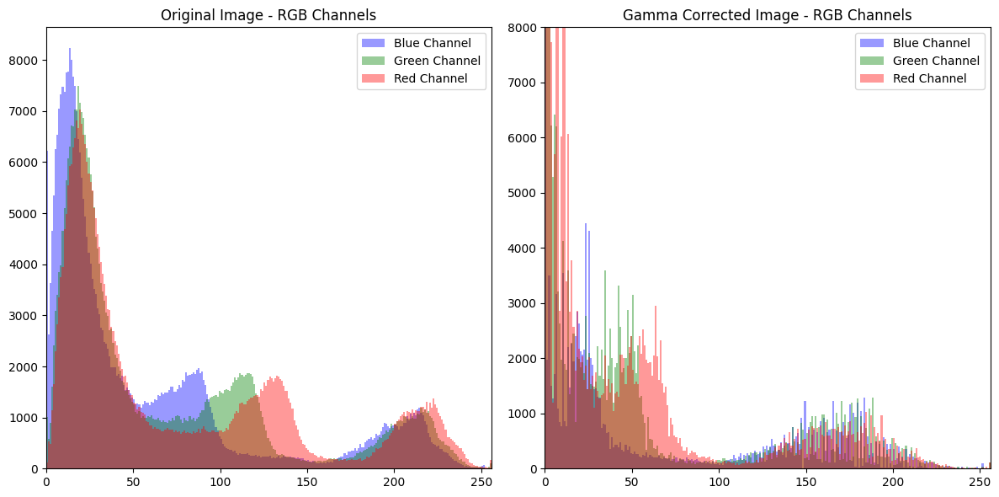

In [9]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image_path = 'a1images/a1images/highlights_and_shadows.jpg'
image = cv.imread(image_path)

# Convert the image to the L*a*b* color space
lab_image = cv.cvtColor(image, cv.COLOR_BGR2LAB)

# Split into L*, a*, b* channels
L, a, b = cv.split(lab_image)

#normalize L
L = L/255.0

# Apply gamma correction to the L* plane
gamma = 2.2  # Example gamma value
L_corrected = np.array( 255*(L) ** (gamma), dtype='uint8')

# Merge the corrected L* channel back with the original a* and b* channels
lab_corrected = cv.merge((L_corrected, a, b))

# Convert back to BGR color space for display
image_corrected = cv.cvtColor(lab_corrected, cv.COLOR_LAB2BGR)

# Plot original and gamma-corrected images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(image_corrected, cv.COLOR_BGR2RGB))
plt.title('Gamma Corrected Image (γ = 2.2)')
plt.show()

# Create subplots for the original and gamma-corrected histograms
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Original image histograms (Red, Green, Blue in the same plot)
axs[0].set_title('Original Image - RGB Channels')
axs[0].hist(image[:, :, 0].flatten(), bins=256, range=[0, 256], color='b', alpha=0.4, label="Blue Channel")
axs[0].hist(image[:, :, 1].flatten(), bins=256, range=[0, 256], color='g', alpha=0.4, label="Green Channel")
axs[0].hist(image[:, :, 2].flatten(), bins=256, range=[0, 256], color='r', alpha=0.4, label="Red Channel")
axs[0].set_xlim([0, 256])
axs[0].legend()

# Gamma corrected image histograms (Red, Green, Blue in the same plot)
axs[1].set_title('Gamma Corrected Image - RGB Channels')
axs[1].hist(image_corrected[:, :, 0].flatten(), bins=256, range=[0, 256], color='b', alpha=0.4, label="Blue Channel")
axs[1].hist(image_corrected[:, :, 1].flatten(), bins=256, range=[0, 256], color='g', alpha=0.4, label="Green Channel")
axs[1].hist(image_corrected[:, :, 2].flatten(), bins=256, range=[0, 256], color='r', alpha=0.4, label="Red Channel")
axs[1].set_xlim([0, 256])
axs[1].set_ylim([0, 8000])  # Set y-axis limit to reduce dominance of zeros
axs[1].legend()

# Show the plots
plt.tight_layout()
plt.show()


## Question 4

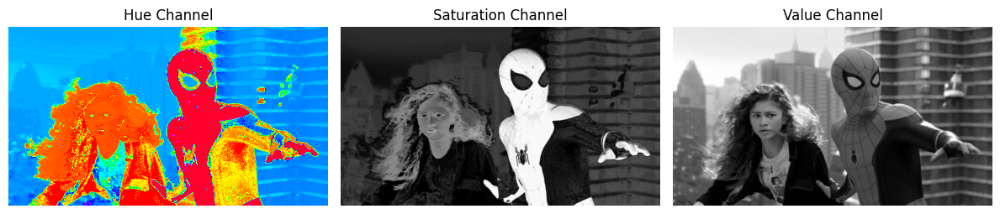

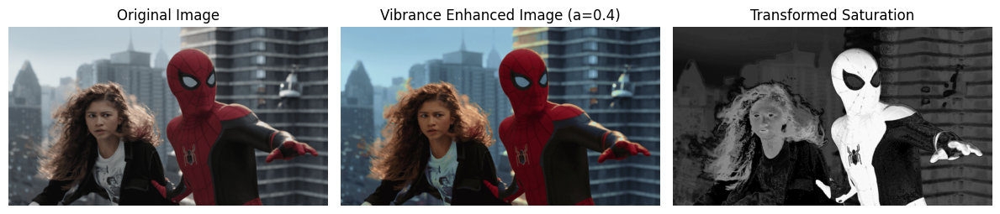

In [69]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image_path = r'a1images\a1images\spider.png'
image = cv2.imread(image_path)

# Convert image from BGR to HSV
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Split the HSV channels
hue, saturation, value = cv2.split(hsv_image)

# Plot the Hue, Saturation, and Value channels
plt.figure(figsize=(12, 4))

# Plot Hue channel
plt.subplot(1, 3, 1)
plt.imshow(hue, cmap='hsv')
plt.title("Hue Channel")
plt.axis('off')

# Plot Saturation channel
plt.subplot(1, 3, 2)
plt.imshow(saturation, cmap='gray')
plt.title("Saturation Channel")
plt.axis('off')

# Plot Value channel
plt.subplot(1, 3, 3)
plt.imshow(value, cmap='gray')
plt.title("Value Channel")
plt.axis('off')

plt.tight_layout()
plt.show()

# Intensity transformation function
def intensity_transform(x, a, sigma=70):
    x = np.clip(x, 0, 255)  # Ensure x stays within valid range
    transformed = x + a * 128 * np.exp(-(x - 128) ** 2 / (2 * sigma ** 2))
    return np.clip(transformed, 0, 255).astype(np.uint8)

# Apply intensity transformation to the saturation plane
a = 0.4  # Selected a value
transformed_saturation = intensity_transform(saturation, a)

# Recombine the modified saturation with the hue and value planes
transformed_hsv = cv2.merge([hue, transformed_saturation, value])

# Convert back to BGR color space
vibrance_enhanced_image = cv2.cvtColor(transformed_hsv, cv2.COLOR_HSV2BGR)

# Display the original image, vibrance-enhanced image, and saturation transformation
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(vibrance_enhanced_image, cv2.COLOR_BGR2RGB))
plt.title(f"Vibrance Enhanced Image (a={a})")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(transformed_saturation, cmap='gray')
plt.title("Transformed Saturation")
plt.axis('off')

plt.tight_layout()
plt.show()


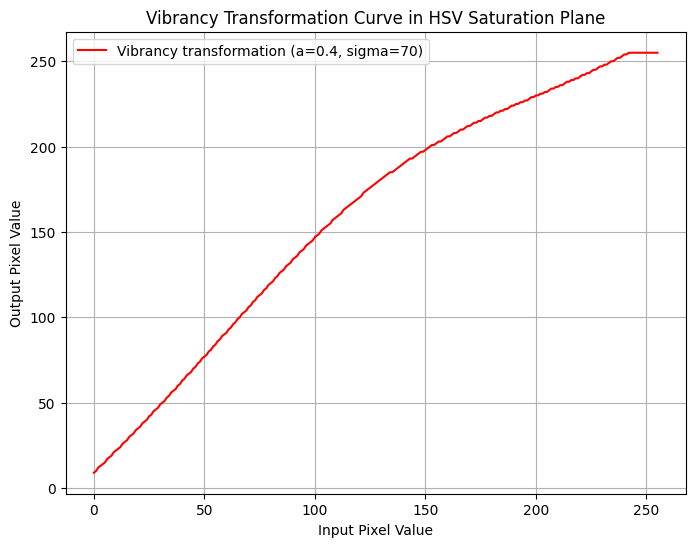

In [18]:
import numpy as np
import matplotlib.pyplot as plt

# Set the transformation parameter 'a'
a = 0.4
sigma = 70

# Generate a range of input pixel values from 0 to 255
input_values = np.arange(0, 256)

# Intensity transformation function
def intensity_transform(x, a, sigma=70):
    x = np.clip(x, 0, 255)  # Ensure x stays within valid range
    transformed = x + a * 128 * np.exp(-(x - 128) ** 2 / (2 * sigma ** 2))
    return np.clip(transformed, 0, 255).astype(np.uint8)

# Apply the transformation to each pixel value
output_values = [intensity_transform(x, a, sigma) for x in input_values]

# Plot the transformation
plt.figure(figsize=(8, 6))
plt.plot(input_values, output_values, label=f'Vibrancy transformation (a={a}, sigma={sigma})', color='red')
plt.xlabel('Input Pixel Value')
plt.ylabel('Output Pixel Value')
plt.title('Vibrancy Transformation Curve in HSV Saturation Plane')
plt.legend()
plt.grid(True)
plt.show()

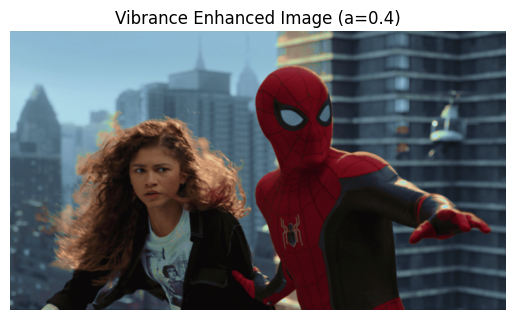

In [19]:
plt.imshow(cv2.cvtColor(vibrance_enhanced_image, cv2.COLOR_BGR2RGB))
plt.title(f"Vibrance Enhanced Image (a={a})")
plt.axis('off')
plt.show()  # Display the plot


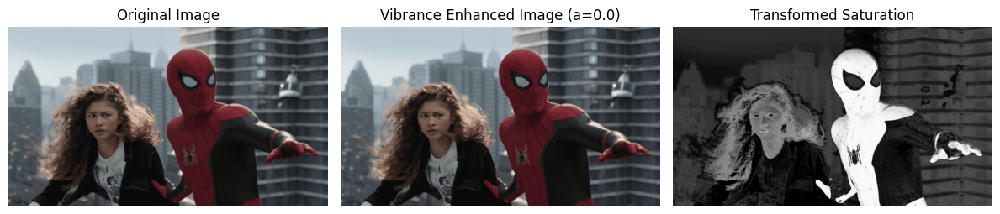

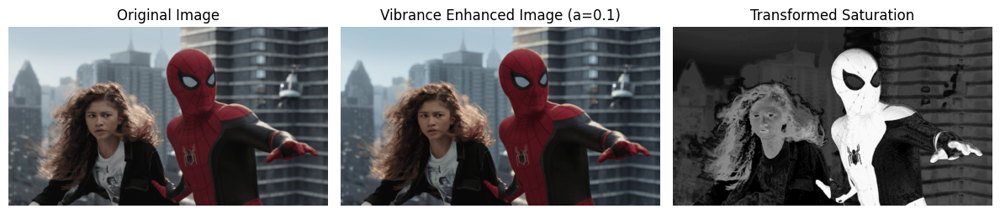

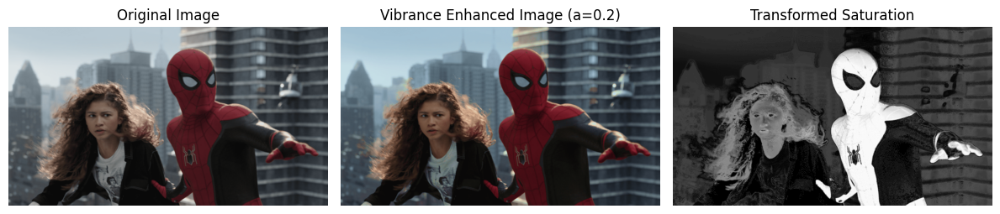

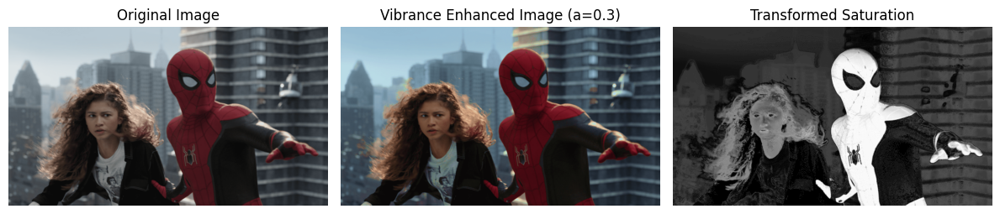

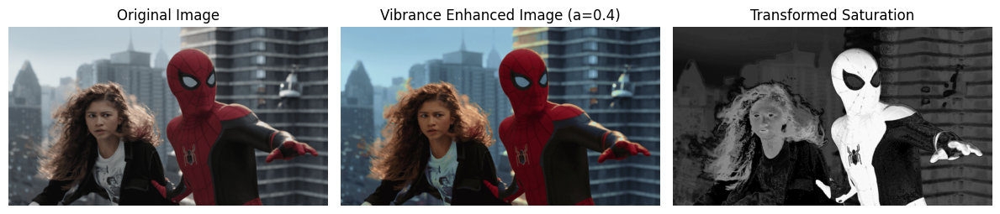

...

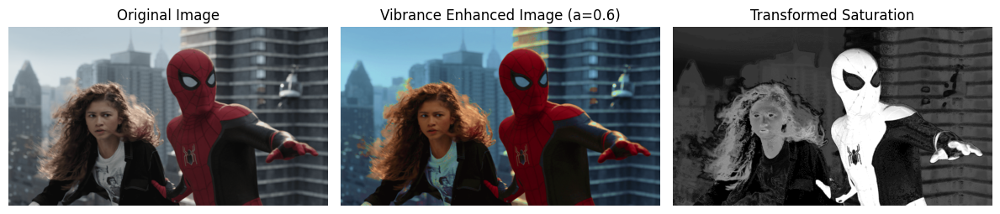

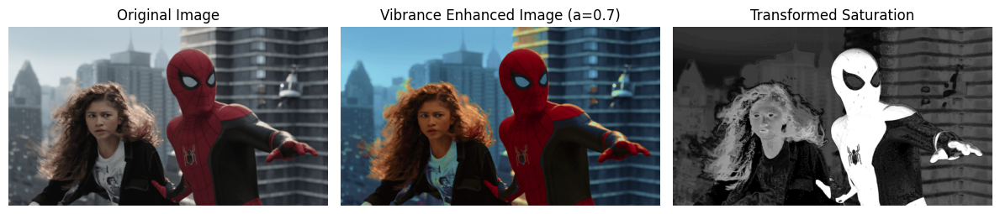

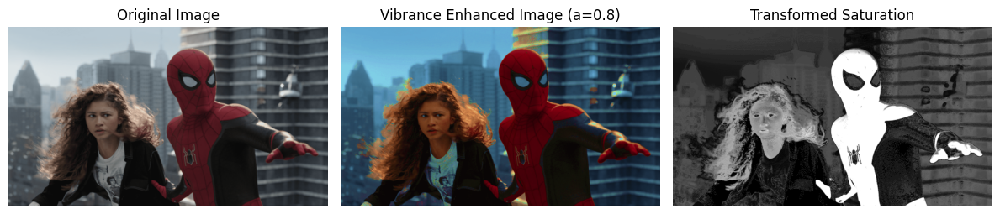

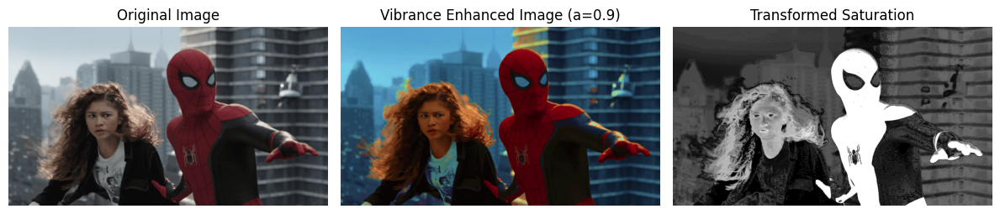

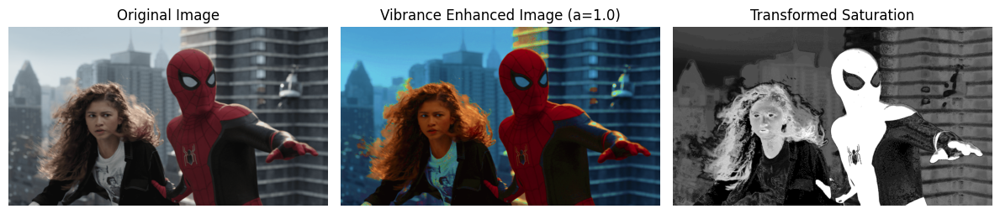

In [12]:
for i in range (0,11,1):
    a=i/10

    transformed_saturation = intensity_transform(saturation, a)

    # Recombine the modified saturation with the hue and value planes
    transformed_hsv = cv2.merge([hue, transformed_saturation, value])

    # Convert back to BGR color space
    vibrance_enhanced_image = cv2.cvtColor(transformed_hsv, cv2.COLOR_HSV2BGR)

    # Display the original image, vibrance-enhanced image, and saturation transformation
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(cv2.cvtColor(vibrance_enhanced_image, cv2.COLOR_BGR2RGB))
    plt.title(f"Vibrance Enhanced Image (a={a})")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(transformed_saturation, cmap='gray')
    plt.title("Transformed Saturation")
    plt.axis('off')

    plt.tight_layout()
    plt.show()






## Question 5

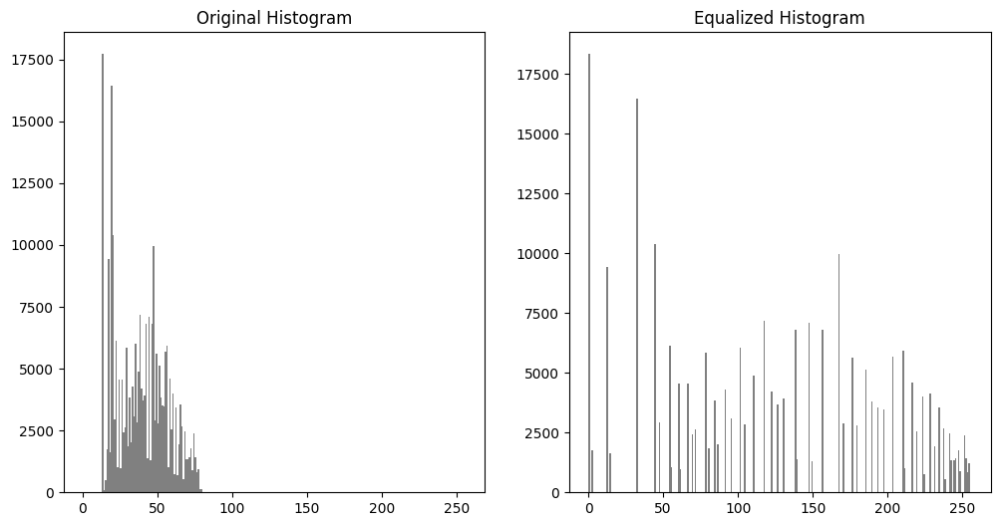

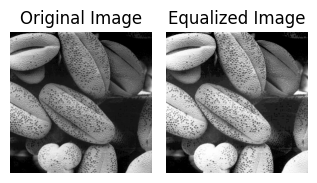

In [71]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Custom function for histogram equalization
def custom_histogram_equalization(img):
    # Get the image histogram
    hist, bins = np.histogram(img.flatten(), 256, [0, 256])
    
    # Compute the cumulative distribution function (CDF)
    cdf = hist.cumsum()
    
    # Normalize the CDF
    cdf_normalized = cdf * hist.max() / cdf.max()
    
    # Apply histogram equalization formula
    cdf_m = np.ma.masked_equal(cdf, 0)  # Mask zeros
    cdf_m = (cdf_m - cdf_m.min()) * 255 / (cdf_m.max() - cdf_m.min())  # Scale
    cdf_final = np.ma.filled(cdf_m, 0).astype('uint8')  # Fill masked values with 0
    
    # Map the original image pixels using the equalized CDF
    equalized_img = cdf_final[img]
    
    return equalized_img

# Load the image and convert to grayscale
image_path = r'a1images\a1images\shells.tif'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Apply custom histogram equalization
equalized_image = custom_histogram_equalization(image)

# Function to plot histograms
def plot_histograms(original_img, equalized_img):
    # Plot histograms
    plt.figure(figsize=(12, 6))
    
    # Original image histogram
    plt.subplot(1, 2, 1)
    plt.hist(original_img.flatten(), 256, [0, 256], color='gray')
    plt.title("Original Histogram")
    
    # Equalized image histogram
    plt.subplot(1, 2, 2)
    plt.hist(equalized_img.flatten(), 256, [0, 256], color='gray')
    plt.title("Equalized Histogram")
    plt.show()
    # Original image
    plt.subplot(1, 4, 3)
    plt.imshow(original_img, cmap='gray')
    plt.title("Original Image")
    plt.axis('off')
    
    # Equalized image
    plt.subplot(1, 4, 4)
    plt.imshow(equalized_img, cmap='gray')
    plt.title("Equalized Image")
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Plot histograms before and after equalization
plot_histograms(image, equalized_image)


## Question 6

### (a) Split into Hue, Saturation, and Value Planes

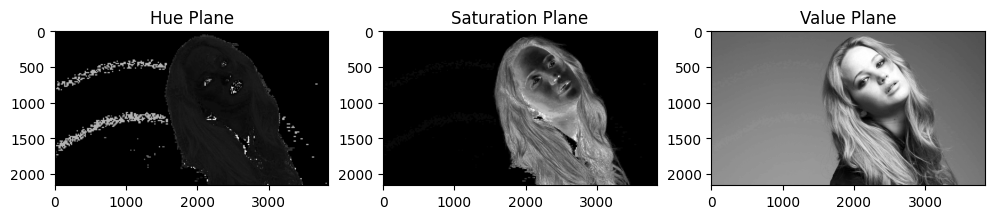

In [149]:
import cv2
import matplotlib.pyplot as plt

# Load the image in color
image_path = r'a1images\a1images\jeniffer.jpg'
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Convert the image from BGR to HSV
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Split the HSV image into hue, saturation, and value channels
hue, saturation, value = cv2.split(hsv_image)

# Display the hue, saturation, and value planes in grayscale
plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.imshow(hue, cmap='gray')
plt.title('Hue Plane')

plt.subplot(1, 3, 2)
plt.imshow(saturation, cmap='gray')
plt.title('Saturation Plane')

plt.subplot(1, 3, 3)
plt.imshow(value, cmap='gray')
plt.title('Value Plane')

plt.show()


### (b) Select Plane and Threshold to Extract Foreground Mask

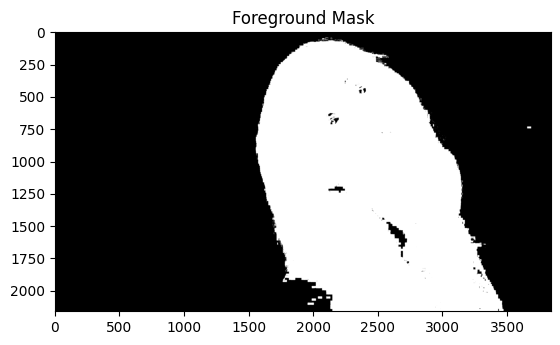

In [150]:
# Threshold the value plane to extract the foreground
_, mask = cv2.threshold(saturation, 12, 255, cv2.THRESH_BINARY)

# Display the mask (foreground extraction)
plt.imshow(mask, cmap='gray')
plt.title('Foreground Mask')
plt.show()


### (c) Obtain Foreground Using cv2.bitwise_and and Compute Histogram

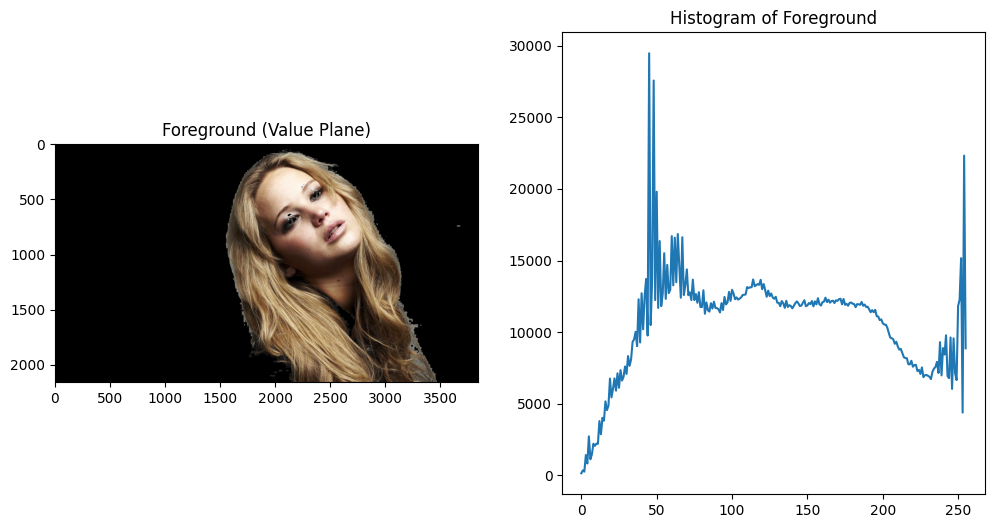

In [151]:
# Apply the mask to extract the foreground from the value plane
foreground = cv2.bitwise_and(image_rgb, image_rgb, mask=mask)

# Compute the histogram of the foreground
hist_foreground = cv2.calcHist([foreground], [0], mask, [256], [0, 256])

# Display the foreground image and its histogram
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(foreground, cmap='gray')
plt.title('Foreground (Value Plane)')

plt.subplot(1, 2, 2)
plt.plot(hist_foreground)
plt.title('Histogram of Foreground')
plt.show()


### (d) Obtain the Cumulative Sum of the Histogram

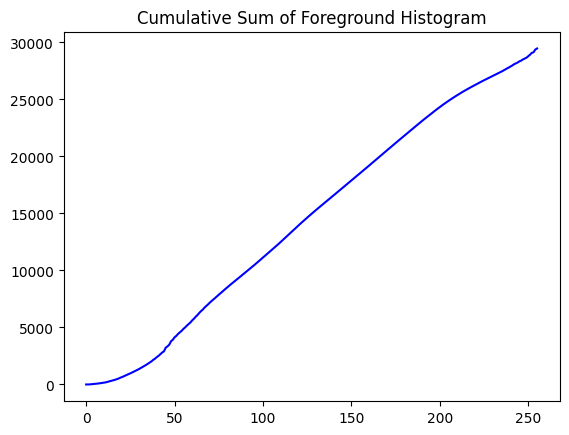

In [152]:
import numpy as np

# Calculate the cumulative sum of the foreground histogram
cdf_foreground = np.cumsum(hist_foreground)

# Normalize the cumulative sum
cdf_normalized = cdf_foreground * hist_foreground.max() / cdf_foreground.max()

# Plot the cumulative distribution function (CDF)
plt.plot(cdf_normalized, color='b')
plt.title('Cumulative Sum of Foreground Histogram')
plt.show()


### (e) Histogram Equalization of the Foreground Using Formulas

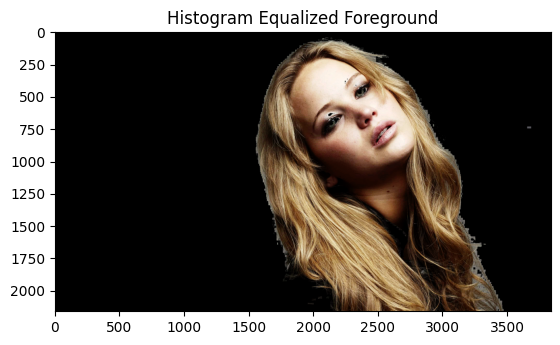

In [153]:
# Mask all zeros to avoid division by zero
cdf_m = np.ma.masked_equal(cdf_foreground, 0)

# Perform histogram equalization: scale the values and fill masked zeros
cdf_m = (cdf_m - cdf_m.min()) * 255 / (cdf_m.max() - cdf_m.min())
cdf_final = np.ma.filled(cdf_m, 0).astype('uint8')

# Apply the equalized CDF to the foreground image
equalized_foreground = cdf_final[foreground]

# Show the histogram-equalized foreground
plt.imshow(equalized_foreground, cmap='gray')
plt.title('Histogram Equalized Foreground')
plt.show()


### (f) Extract Background and Combine with Histogram Equalized Foreground

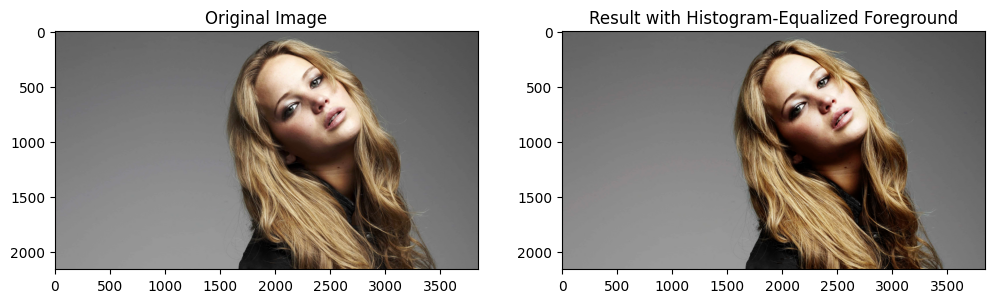

In [160]:
# Invert the mask to obtain the background
background_mask = cv2.bitwise_not(mask)

# Extract the background using the inverted mask
background = cv2.bitwise_and(image_rgb, image_rgb, mask=background_mask)

# Combine the background with the equalized foreground
final_image = cv2.add(cv2.cvtColor(background, cv2.COLOR_BGR2RGB),equalized_foreground )

# Convert the final HSV image back to BGR and then to RGB for display
result_image = cv2.cvtColor(final_image, cv2.COLOR_BGR2RGB)

# Show the original image and the result with histogram-equalized foreground
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))  # Convert the original image to RGB
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))  # Display the result directly in RGB
plt.title('Result with Histogram-Equalized Foreground')
plt.show()



## Question 7

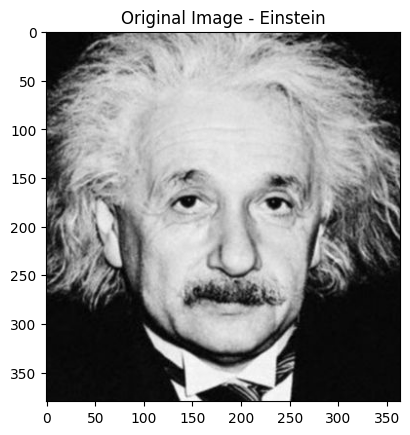

In [170]:
import cv2
import matplotlib.pyplot as plt

# Load the Einstein image in grayscale
image_path = r'a1images\a1images\einstein.png'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Display the original image
plt.imshow(image, cmap='gray')
plt.title('Original Image - Einstein')
plt.show()


### (a) Using cv2.filter2D to Sobel Filter the Image
The cv2.filter2D function is used here to apply the Sobel filter.

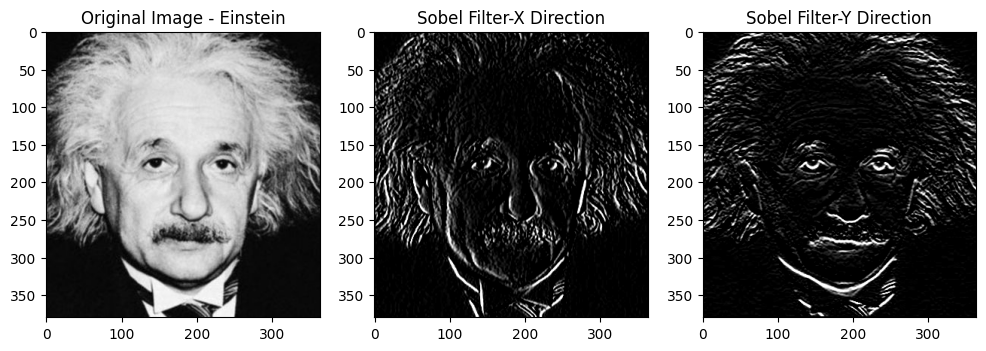

In [173]:
import numpy as np

# Sobel kernels for X and Y directions
sobel_x = np.array([[-1, 0, 1],
                    [-2, 0, 2],
                    [-1, 0, 1]])

sobel_y = np.array([[-1, -2, -1],
                    [ 0,  0,  0],
                    [ 1,  2,  1]])

# Apply the Sobel filter using cv2.filter2D
sobel_filtered_x = cv2.filter2D(image, -1, sobel_x)
sobel_filtered_y = cv2.filter2D(image, -1, sobel_y)

# Display the Sobel filtered images
# Display the original image
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image - Einstein')

plt.subplot(1, 3, 2)
plt.imshow(sobel_filtered_x, cmap='gray')
plt.title('Sobel Filter-X Direction')

plt.subplot(1, 3, 3)
plt.imshow(sobel_filtered_y,cmap='gray')
plt.title('Sobel Filter-Y Direction')
plt.show()


### (b) Own Code for Sobel Filtering
Here is the manual implementation of the Sobel filter using convolution.

In [126]:
print("Sobel X filter:")
print(sobel_x)

print("\nSobel Y filter:")
print(sobel_y)

Sobel X filter:
[[-1  0  1]
 [-2  0  2]
 [-1  0  1]]

Sobel Y filter:
[[-1 -2 -1]
 [ 0  0  0]
 [ 1  2  1]]


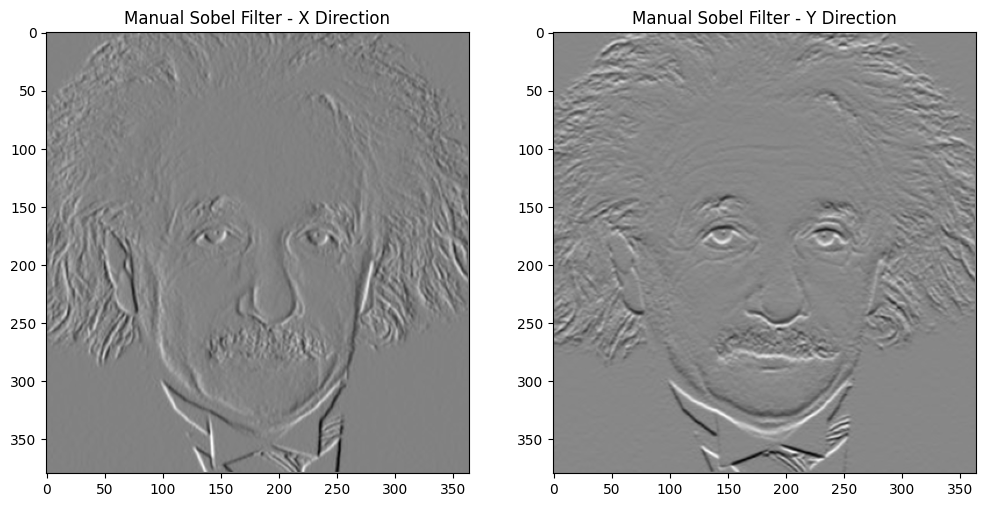

In [140]:
def sobel_filter(image, kernel):
    [h, w] = np.shape(image) # Get rows and columns of the image
    output= np.zeros(shape=(h, w)) # Create empty image
    
    # Convolve the image with the kernel
    for i in range(1,h-1):
        for j in range(1, w-1):
            output[i, j] = np.sum(np.multiply(kernel,image[i-1:i + 2, j-1:j + 2]))
    return output

# Manually apply Sobel filters
sobel_manual_x = sobel_filter(image, sobel_x)
sobel_manual_y = sobel_filter(image, sobel_y)

# Display the manually filtered images
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(sobel_manual_x,cmap='gray')
plt.title('Manual Sobel Filter - X Direction')

plt.subplot(1, 2, 2)
plt.imshow(sobel_manual_y, cmap='gray')
plt.title('Manual Sobel Filter - Y Direction')
plt.show()


### (c) Using the Property
We are going to use the separable Sobel filter property to convolve in two stages: first along the rows, then along the columns.

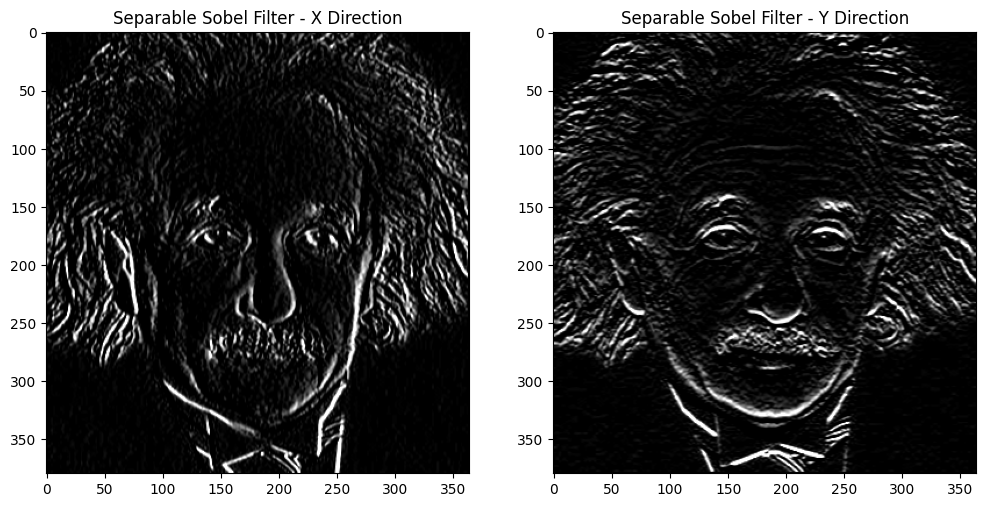

In [141]:
# Sobel filter property split into two 1D filters
kernel_x_row = np.array([[1, 0, -1]])  # 1x3
kernel_x_col = np.array([[1], [2], [1]])  # 3x1

# Apply separable Sobel filtering
sobel_separable_x = cv2.filter2D(image, -1, kernel_x_row)
sobel_separable_x = cv2.filter2D(sobel_separable_x, -1, kernel_x_col)

# Sobel filter in the Y direction using the same property
kernel_y_row = np.array([[1], [0], [-1]])  # 3x1
kernel_y_col = np.array([[1, 2, 1]])  # 1x3

sobel_separable_y = cv2.filter2D(image, -1, kernel_y_row)
sobel_separable_y = cv2.filter2D(sobel_separable_y, -1, kernel_y_col)

# Display the separable Sobel filtered images
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(sobel_separable_x, cmap='gray')
plt.title('Separable Sobel Filter - X Direction')

plt.subplot(1, 2, 2)
plt.imshow(sobel_separable_y, cmap='gray')
plt.title('Separable Sobel Filter - Y Direction')
plt.show()


## Question 8

In [161]:
def zoom_image(image, factor, method='nearest'):
    """Zoom the image by a given factor using the specified interpolation method."""
    newsize = (int(image.shape[1] * factor), int(image.shape[0] * factor))
    if method == 'nearest':
        zoomed_image = cv2.resize(image, newsize, interpolation=cv2.INTER_NEAREST)
    elif method == 'bilinear':
        zoomed_image = cv2.resize(image, newsize, interpolation=cv2.INTER_LINEAR)
    else:
        raise ValueError("Method must be 'nearest' or 'bilinear'.")
    return zoomed_image


In [164]:
def compute_ssd(original, zoomed):
    ssd = np.sum((original - zoomed) ** 2)
    normalized_ssd = ssd / original.size
    return normalized_ssd

# Display images
def display_images(original, zoomed_nearest, zoomed_bilinear):
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')

    plt.subplot(1, 3, 2)
    plt.imshow(cv2.cvtColor(zoomed_nearest, cv2.COLOR_BGR2RGB))
    plt.title(f'Nearest Neighbour Method')

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(zoomed_bilinear, cv2.COLOR_BGR2RGB))
    plt.title(f'Bilinear Interpolation Method')
    plt.show()


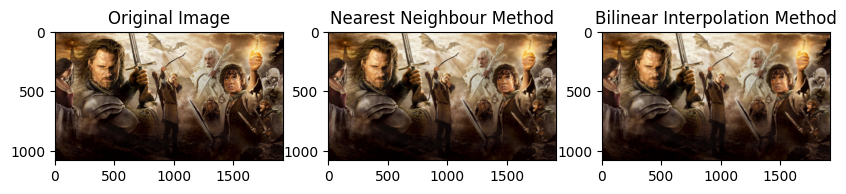

Nearest neighbour ssd =  31.284316486625514
Bilinear interpolation ssd =  31.053094618055557


In [165]:
# Load images
large_image_path1 = r'a1images\a1images\a1q5images\im01.png'
small_image_path1= r'a1images\a1images\a1q5images\im01small.png'

# Load original and zoomed-out images for testing
large_image1 = cv2.imread(large_image_path1)
small_image1 = cv2.imread(small_image_path1)
# Zoom the small image by a factor of 4
factor = 4
zoomed_image_nearest1 = zoom_image(small_image1, factor, method='nearest')
zoomed_image_bilinear1 = zoom_image(small_image1, factor, method='bilinear')

# Compute SSD with the original large image
ssd_nearest1 = compute_ssd(large_image1, zoomed_image_nearest1)
ssd_bilinear1 = compute_ssd(large_image1, zoomed_image_bilinear1)

display_images(large_image1, zoomed_image_nearest1,zoomed_image_bilinear1 )

print('Nearest neighbour ssd = ', ssd_nearest1)
print('Bilinear interpolation ssd = ', ssd_bilinear1)


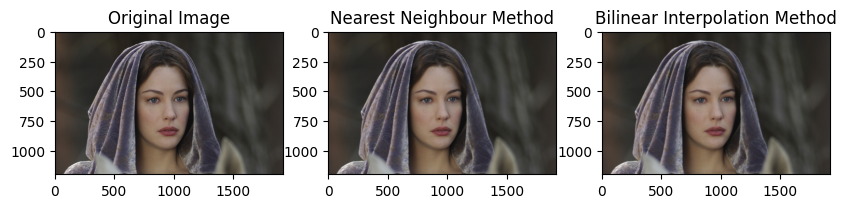

Nearest neighbour ssd =  11.902013310185184
Bilinear interpolation ssd =  10.682991753472223


In [166]:
large_image_path2 = r'a1images\a1images\a1q5images\im02.png'
small_image_path2 = r'a1images\a1images\a1q5images\im02small.png'

# Load original and zoomed-out images for testing
large_image2 = cv2.imread(large_image_path2)
small_image2 = cv2.imread(small_image_path2)
# Zoom the small image by a factor of 4
factor = 4
zoomed_image_nearest2 = zoom_image(small_image2, factor, method='nearest')
zoomed_image_bilinear2 = zoom_image(small_image2, factor, method='bilinear')

# Compute SSD with the original large image
ssd_nearest2 = compute_ssd(large_image2, zoomed_image_nearest2)
ssd_bilinear2 = compute_ssd(large_image2, zoomed_image_bilinear2)

display_images(large_image2, zoomed_image_nearest2,zoomed_image_bilinear2 )

print('Nearest neighbour ssd = ', ssd_nearest2)
print('Bilinear interpolation ssd = ', ssd_bilinear2)

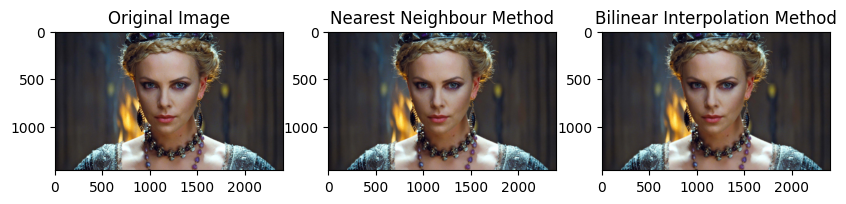

Nearest neighbour ssd =  17.0657839273475
Bilinear interpolation ssd =  16.550198195110806


In [167]:
# Load images
large_image_path3 = r'a1images\a1images\a1q5images\im03.png'
small_image_path3 = r'a1images\a1images\a1q5images\im03small.png'

# Load original and zoomed-out images for testing
large_image3 = cv2.imread(large_image_path3)
small_image3 = cv2.imread(small_image_path3)

def resize_to_match(image, target_shape):
    return cv2.resize(image, (target_shape[1], target_shape[0]))

# Zoom the small image by a factor of 4
factor = 4
zoomed_image_nearest3 = zoom_image(small_image3, factor, method='nearest')
zoomed_image_bilinear3 = zoom_image(small_image3, factor, method='bilinear')

# Resize the zoomed images to match the original large image dimensions
zoomed_image_nearest3_resized = resize_to_match(zoomed_image_nearest3, large_image3.shape)
zoomed_image_bilinear3_resized = resize_to_match(zoomed_image_bilinear3, large_image3.shape)

# Now compute SSD with the resized images
ssd_nearest3 = compute_ssd(large_image3, zoomed_image_nearest3_resized)
ssd_bilinear3 = compute_ssd(large_image3, zoomed_image_bilinear3_resized)

# Display images
display_images(large_image3, zoomed_image_nearest3_resized, zoomed_image_bilinear3_resized)

print('Nearest neighbour ssd = ', ssd_nearest3)
print('Bilinear interpolation ssd = ', ssd_bilinear3)


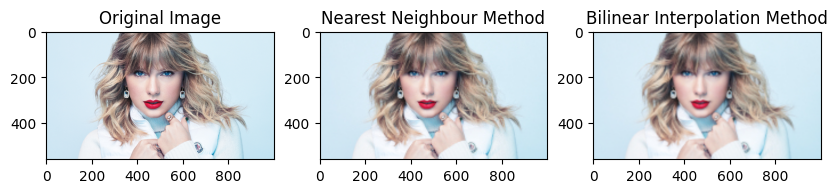

Nearest neighbour ssd =  36.5598125
Bilinear interpolation ssd =  36.58130119047619


In [168]:
# Load images
large_image_path4 = r'a1images\a1images\a1q5images\taylor.jpg'
small_image_path4 = r'a1images\a1images\a1q5images\taylor_small.jpg'

# Load original and zoomed-out images for testing
large_image4 = cv2.imread(large_image_path4)
small_image4 = cv2.imread(small_image_path4)

def resize_to_match(image, target_shape):
    return cv2.resize(image, (target_shape[1], target_shape[0]))

# Zoom the small image by a factor of 4
factor = 4
zoomed_image_nearest4 = zoom_image(small_image4, factor, method='nearest')
zoomed_image_bilinear4 = zoom_image(small_image4, factor, method='bilinear')

# Resize the zoomed images to match the original large image dimensions
zoomed_image_nearest4_resized = resize_to_match(zoomed_image_nearest4, large_image4.shape)
zoomed_image_bilinear4_resized = resize_to_match(zoomed_image_bilinear4, large_image4.shape)

# Now compute SSD with the resized images
ssd_nearest4 = compute_ssd(large_image4, zoomed_image_nearest4_resized)
ssd_bilinear4 = compute_ssd(large_image4, zoomed_image_bilinear4_resized)

# Display images
display_images(large_image4, zoomed_image_nearest4_resized, zoomed_image_bilinear4_resized)

print('Nearest neighbour ssd = ', ssd_nearest4)
print('Bilinear interpolation ssd = ', ssd_bilinear4)

## Question 9

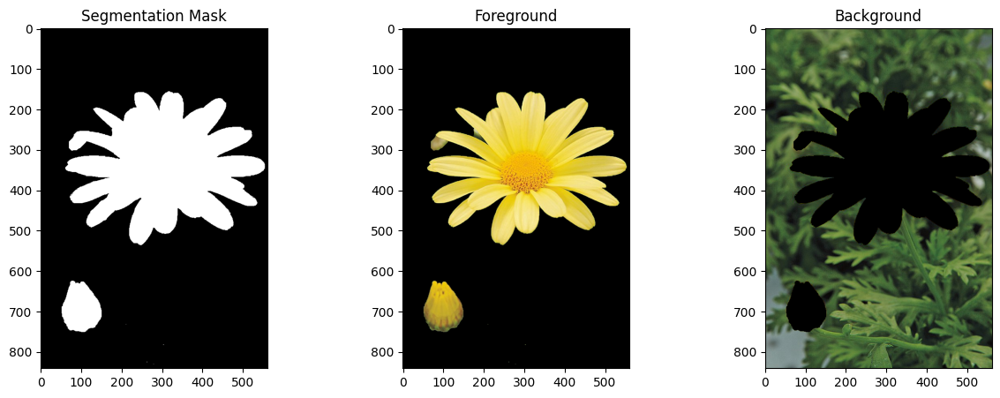

In [48]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image
image_path = r'a1images\a1images\daisy.jpg'
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Initial mask (all zeros)
mask = np.zeros(image.shape[:2], np.uint8)

# Background and foreground models (used internally by GrabCut)
bg_model = np.zeros((1, 65), np.float64)
fg_model = np.zeros((1, 65), np.float64)

# Define a bounding box around the object (flower)
rect = (50, 50, image.shape[1] - 50, image.shape[0] - 50)

# Apply GrabCut algorithm
cv2.grabCut(image, mask, rect, bg_model, fg_model, 5, cv2.GC_INIT_WITH_RECT)

# Modify mask to get the foreground
mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')
foreground = image_rgb * mask2[:, :, np.newaxis]

# Extract the background
background = image_rgb * (1 - mask2[:, :, np.newaxis])

# Display segmentation results
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(mask2, cmap='gray')
plt.title('Segmentation Mask')

plt.subplot(1, 3, 2)
plt.imshow(foreground)
plt.title('Foreground')

plt.subplot(1, 3, 3)
plt.imshow(background)
plt.title('Background')

plt.show()


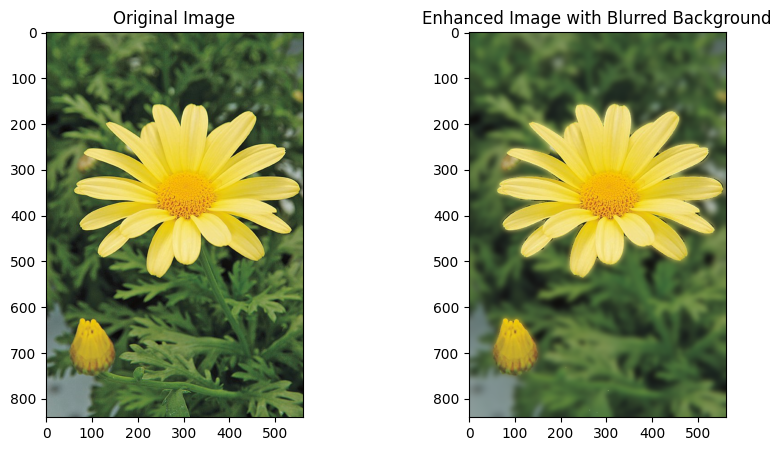

In [49]:
# Apply Gaussian blur to the background
blurred_background = cv2.GaussianBlur(image_rgb, (35, 35), 0)

# Combine the blurred background with the foreground
enhanced_image = blurred_background * (1 - mask2[:, :, np.newaxis]) + foreground

# Display original and enhanced images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(enhanced_image.astype('uint8'))
plt.title('Enhanced Image with Blurred Background')

plt.show()
